In [1]:
from pandas import read_excel
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import scipy
import statsmodels.formula.api as smf
import statsmodels.api as sm

import sklearn
from sklearn import model_selection, preprocessing, feature_selection, ensemble, linear_model, metrics, decomposition
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, explained_variance_score, max_error
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, mean_absolute_percentage_error, d2_tweedie_score

In [2]:
df = pd.read_csv('/kaggle/input/secondary-school-result/Business Studies.csv') 
df.head()

,Gender,Father Highest Academic Qualification,Mother Highest Academic Qualification,Father Profession,Mother Profession,Father average monthly income,Mother average monthly income,How many siblings do you have,District Currently you are living,PEC Result Overall GPA,...,JSC Overall GPA,JSC Bangla,JSC English,JSC Mathematics,JSC BGS,JSC ICT,JSC Religion,JSC Science,Group SSC,Overall GPA SSC
0,1,4,1,0,2,0,0,7,0,4.25,...,3.28,4.0,3.5,3.5,4.0,4.0,5.0,3.5,1,3.56
1,1,5,1,0,2,50000,0,4,0,5.00,...,5.00,4.0,5.0,5.0,5.0,5.0,5.0,5.0,1,5.00
2,1,4,2,1,2,30000,0,3,6,5.00,...,4.90,4.0,5.0,5.0,5.0,3.5,4.0,5.0,1,4.67
3,1,5,4,0,2,90000,0,1,5,5.00,...,5.00,5.0,5.0,4.0,5.0,5.0,5.0,5.0,1,4.68
4,1,1,0,1,2,100000,35000,7,4,4.55,...,5.00,4.0,5.0,4.0,5.0,5.0,5.0,5.0,1,4.55


In [3]:
df.describe()

,Gender,Father Highest Academic Qualification,Mother Highest Academic Qualification,Father Profession,Mother Profession,Father average monthly income,Mother average monthly income,How many siblings do you have,District Currently you are living,PEC Result Overall GPA,...,JSC Overall GPA,JSC Bangla,JSC English,JSC Mathematics,JSC BGS,JSC ICT,JSC Religion,JSC Science,Group SSC,Overall GPA SSC
count,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,...,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.0,110.000000
mean,0.709091,3.163636,2.554545,0.727273,1.872727,68163.636364,7468.181818,2.409091,1.427273,4.430182,...,4.392273,4.190909,4.090909,4.136364,4.309091,4.445455,4.413636,4.363636,1.0,4.291455
std,0.456260,1.672921,1.547928,0.728315,0.471365,100179.062369,19248.052120,1.698869,1.809552,0.607023,...,0.571386,0.738775,0.974872,0.818112,0.744958,0.733677,0.669996,0.756953,0.0,0.546397
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.360000,...,2.780000,2.000000,1.000000,2.000000,2.000000,2.000000,3.000000,2.000000,1.0,2.940000
25%,0.000000,2.000000,2.000000,0.000000,2.000000,20000.000000,0.000000,1.000000,0.000000,4.250000,...,4.150000,3.500000,3.500000,3.500000,4.000000,4.000000,4.000000,4.000000,1.0,4.060000
50%,1.000000,4.000000,3.000000,1.000000,2.000000,50000.000000,0.000000,2.000000,0.000000,4.590000,...,4.500000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,5.000000,1.0,4.390000
75%,1.000000,5.000000,4.000000,1.000000,2.000000,78750.000000,0.000000,3.000000,2.750000,4.860000,...,4.890000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.0,4.680000
max,1.000000,5.000000,5.000000,2.000000,2.000000,800000.000000,100000.000000,8.000000,7.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.0,5.000000


In [4]:
df.shape

(110, 26)

In [5]:
# df.columns

In [6]:
# df.nunique()

In [7]:
# df.isnull().sum()

In [8]:
df.drop('Group SSC', axis=1, inplace=True)

In [9]:
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split

X = df.drop(columns=['Overall GPA SSC'],axis=1)
y = df['Overall GPA SSC']

X = scale(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

##### Metrics

In [10]:
l = []
def mape(actual, pred): 
    actual, pred = np.array(actual), np.array(pred)
    return np.mean(np.abs((actual - pred) / actual)) * 100

def metrics(model_name, y_pred_test_x):
    mean = mean_absolute_error(y_test, y_pred_test_x)
    rmse = mean_squared_error(y_test, y_pred_test_x, squared=False)
    r2 = r2_score(y_test, y_pred_test_x)
    explained_variance = explained_variance_score(y_test, y_pred_test_x, sample_weight=None, multioutput='uniform_average')
    max_error_ = max_error(y_test, y_pred_test_x)
    mean_poisson_deviance_ = mean_poisson_deviance(y_test, y_pred_test_x)
    mean_gamma_deviance_ = mean_gamma_deviance(y_test, y_pred_test_x)
    mean_absolute_percentage_error_ = mean_absolute_percentage_error(y_test, y_pred_test_x)
    d2_tweedie_score_ = d2_tweedie_score(y_test, y_pred_test_x)
    mape_ = mape(y_test, y_pred_test_x)
    
    print("Mean Absolute Error: ",mean )
    print("Mean Squared Error: ",rmse )
    print("R2 score: ",r2 )
    print("Explained Variance: ",explained_variance )
    print("max_error: ",max_error_ )
    print("neg_mean_poisson_deviance: ",mean_poisson_deviance_ )
    print("neg_mean_gamma_deviance: ",mean_gamma_deviance_ )
    print("neg_mean_absolute_percentage_error: ",mean_absolute_percentage_error_ )
    print("d2_tweedie_score: ",d2_tweedie_score_ )
    print("mape_: ", mape_)
    l.append([model_name, explained_variance, max_error_, mean, rmse, r2, mape_, mean_poisson_deviance_, mean_gamma_deviance_, mean_absolute_percentage_error_, d2_tweedie_score_])

In [11]:
from sklearn.inspection import permutation_importance

feature_names = ['Gender', 'F Edu', 'M Edu', 'F Prof', 'M Prof', 'F Avg Inc', 'M Avg Inc', 'Siblings', 'Distri','Pec Res Ov' ,'Pec Bangla','Pec English', 'Pec Math', 'Pec Reli', 'Pec BGS', 'Pec Sci', 'Jsc Res Ov','Jsc Bangla','Jsc english','Jsc Math','Jsc bgs','jsc ict','jsc reli', 'jsc sci']
features = np.array(feature_names)

def feature_importance(model):
    perm_importance = permutation_importance(model, X_test, y_test)
    sorted_idx = perm_importance.importances_mean.argsort()
    plt.barh(features[sorted_idx], perm_importance.importances_mean[sorted_idx])
    plt.xlabel("Permutation Importance")

def predicted_plot(y_pred_test_x):
    fig, ax = plt.subplots(nrows=1, ncols=2)
    from statsmodels.graphics.api import abline_plot
    ax[0].scatter(y_pred_test_x, y_test, color="black")
    abline_plot(intercept=0, slope=1, color="red", ax=ax[0])
    ax[0].grid(True)
    ax[0].set(xlabel="Predicted", ylabel="True", title="Predicted vs True")
    ax[0].legend()
    plt.show()

### SVR

Mean Absolute Error:  0.26357487156755277
Mean Squared Error:  0.3659419803898798
R2 score:  0.534091922158244
Explained Variance:  0.5589159823799921
max_error:  1.2033087677609382
neg_mean_poisson_deviance:  0.033906098402745055
neg_mean_gamma_deviance:  0.008706040558610451
neg_mean_absolute_percentage_error:  0.06904104358941442
d2_tweedie_score:  0.5340919221582439
mape_:  6.904104358941441


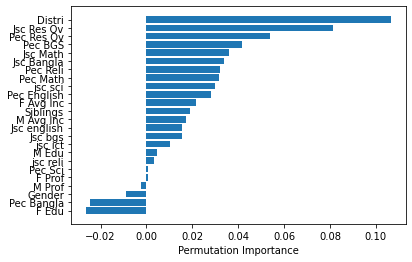

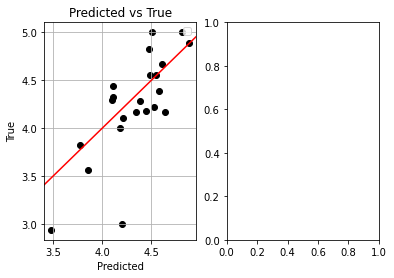

In [12]:
from sklearn.svm import SVR
svr = SVR(kernel = 'rbf')
svr.fit(X_train,y_train)

y_pred_test_x_svr = svr.predict(X_test)
metrics("SVR",y_pred_test_x_svr)
feature_importance(svr)
predicted_plot(y_pred_test_x_svr)

Mean Absolute Error:  0.26662272727272723
Mean Squared Error:  0.3842235470281707
R2 score:  0.4863778717537328
Explained Variance:  0.5148931922543877
max_error:  1.3754999999999988
neg_mean_poisson_deviance:  0.03653592431075667
neg_mean_gamma_deviance:  0.009134267937865849
neg_mean_absolute_percentage_error:  0.06895008893147793
d2_tweedie_score:  0.4863778717537327
mape_:  6.895008893147793


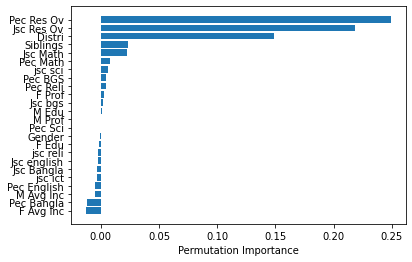

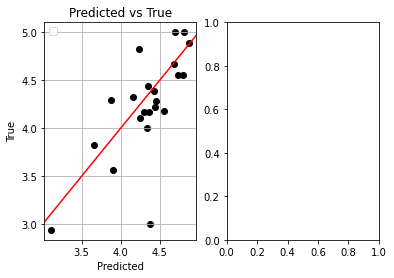

In [13]:
from sklearn.ensemble import RandomForestRegressor
rf_regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
rf_regressor.fit(X_train,y_train)

y_pred_test_x_rf = rf_regressor.predict(X_test)
metrics("Random Forest",y_pred_test_x_rf)
feature_importance(rf_regressor)
predicted_plot(y_pred_test_x_rf)

Mean Absolute Error:  0.31689904769337524
Mean Squared Error:  0.4299131516938795
R2 score:  0.3569611173049041
Explained Variance:  0.3577985369936263
max_error:  1.378017846853469
neg_mean_poisson_deviance:  0.04469168258549073
neg_mean_gamma_deviance:  0.010942211871128447
neg_mean_absolute_percentage_error:  0.07890603951334106
d2_tweedie_score:  0.356961117304904
mape_:  7.890603951334106


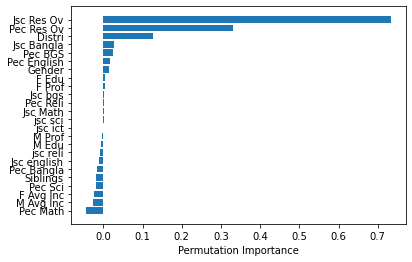

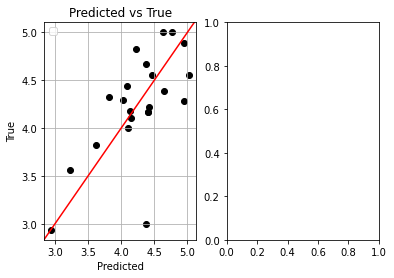

In [14]:
from sklearn import linear_model
lr = linear_model.LinearRegression()
lr.fit(X_train, y_train)

y_pred_test_x_lr = lr.predict(X_test)
metrics("Linear Regression",y_pred_test_x_lr)
feature_importance(lr)
predicted_plot(y_pred_test_x_lr)

Mean Absolute Error:  0.2973304786470931
Mean Squared Error:  0.40952648746984155
R2 score:  0.4165014716989355
Explained Variance:  0.45763108856609525
max_error:  1.333947368421052
neg_mean_poisson_deviance:  0.042029109300041376
neg_mean_gamma_deviance:  0.010665074265877898
neg_mean_absolute_percentage_error:  0.07692713831124857
d2_tweedie_score:  0.4165014716989355
mape_:  7.692713831124857


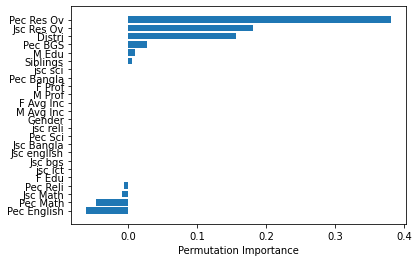

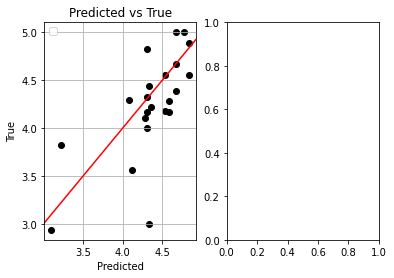

In [15]:
from sklearn.ensemble import AdaBoostRegressor
ADA = AdaBoostRegressor(n_estimators=5, random_state=42)
ADA.fit(X_train, y_train)

y_pred_test_x_ada = ADA.predict(X_test)
metrics("ADA Boost Regressor",y_pred_test_x_ada)
feature_importance(ADA)
predicted_plot(y_pred_test_x_ada)

Mean Absolute Error:  0.2679462909698487
Mean Squared Error:  0.3701859359986614
R2 score:  0.5232226642813984
Explained Variance:  0.5511532242081365
max_error:  1.2562041282653809
neg_mean_poisson_deviance:  0.03409899382213754
neg_mean_gamma_deviance:  0.008583585545210609
neg_mean_absolute_percentage_error:  0.06874357616023301
d2_tweedie_score:  0.5232226642813984
mape_:  6.874357616023301


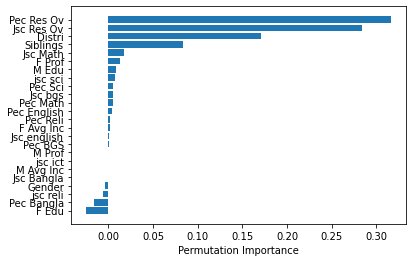

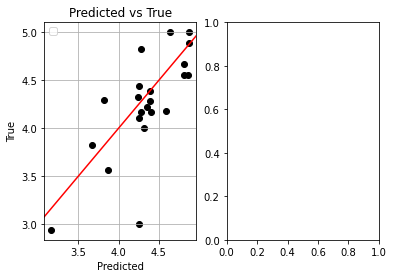

In [16]:
import xgboost
XG = xgboost.XGBRFRegressor()
XG.fit(X_train, y_train)

y_pred_test_x_XG = XG.predict(X_test)
metrics("XGBoost",y_pred_test_x_XG)
feature_importance(XG)
predicted_plot(y_pred_test_x_XG)

Mean Absolute Error:  0.7298329905777059
Mean Squared Error:  0.9276542062870823
R2 score:  -1.9939738889510772
Explained Variance:  -1.8915639096404533
max_error:  2.0004110469499987
neg_mean_poisson_deviance:  0.2217757760202321
neg_mean_gamma_deviance:  0.059418163932029394
neg_mean_absolute_percentage_error:  0.18102642009466863
d2_tweedie_score:  -1.9939738889510772
mape_:  18.102642009466862


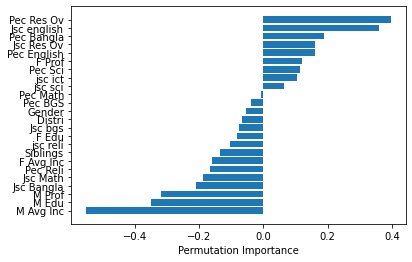

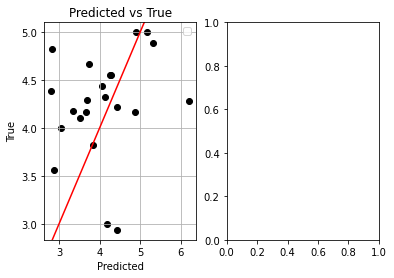

In [17]:
from sklearn.neural_network import MLPRegressor
MLP = MLPRegressor(random_state=42, max_iter=2000)
MLP.fit(X_train, y_train)

y_pred_test_x_MLP = MLP.predict(X_test)
metrics("MLP",y_pred_test_x_MLP)
feature_importance(MLP)
predicted_plot(y_pred_test_x_MLP)

Mean Absolute Error:  0.3192474950178561
Mean Squared Error:  0.4506567650099902
R2 score:  0.29340987791958184
Explained Variance:  0.3157740381768044
max_error:  1.2978455736750814
neg_mean_poisson_deviance:  0.050925763169115304
neg_mean_gamma_deviance:  0.012926490752733394
neg_mean_absolute_percentage_error:  0.08388411233129839
d2_tweedie_score:  0.29340987791958184
mape_:  8.388411233129839


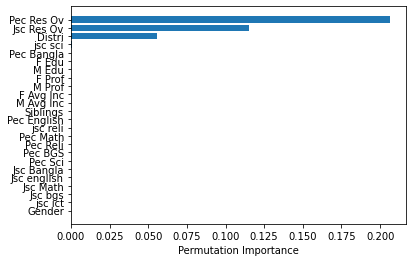

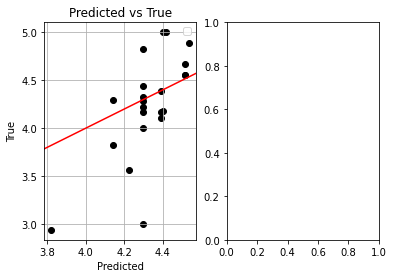

In [18]:
from sklearn.ensemble import GradientBoostingRegressor
GRADIENT = GradientBoostingRegressor(n_estimators=5, random_state=42)
GRADIENT.fit(X_train, y_train)

y_pred_test_x_GRADIENT = GRADIENT.predict(X_test)
metrics("GRADIENT",y_pred_test_x_GRADIENT)
feature_importance(GRADIENT)
predicted_plot(y_pred_test_x_GRADIENT)

In [19]:
estimator=[]
for i in range(1, 30):
    model = GradientBoostingRegressor(n_estimators=i, random_state=42)
    model.fit(X_train, y_train)
    score = model.score(X_test, y_test) 
    estimator.append(score)
    
(estimator.index(max(estimator)))+1

28

Mean Absolute Error:  0.2628044968652883
Mean Squared Error:  0.37468553580074204
R2 score:  0.511561792971126
Explained Variance:  0.5418478173997063
max_error:  1.2411124068124693
neg_mean_poisson_deviance:  0.03492931965873341
neg_mean_gamma_deviance:  0.008810958975324386
neg_mean_absolute_percentage_error:  0.06790806806640332
d2_tweedie_score:  0.511561792971126
mape_:  6.790806806640331


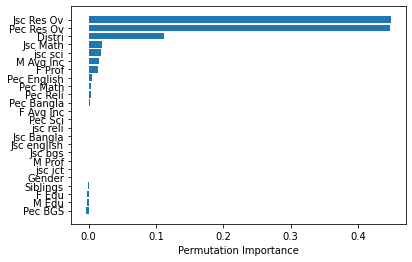

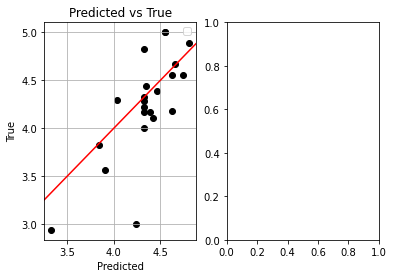

In [20]:
from sklearn.ensemble import GradientBoostingRegressor
GRADIENT = GradientBoostingRegressor(n_estimators= 17, random_state=42)
GRADIENT.fit(X_train, y_train)

y_pred_test_x_GRADIENT = GRADIENT.predict(X_test)
metrics("Optimized GRADIENT",y_pred_test_x_GRADIENT)
feature_importance(GRADIENT)
predicted_plot(y_pred_test_x_GRADIENT)

Mean Absolute Error:  0.33381818181818185
Mean Squared Error:  0.4366043559521179
R2 score:  0.3367887251857472
Explained Variance:  0.47709653118027273
max_error:  1.2700000000000005
neg_mean_poisson_deviance:  0.04628943969851324
neg_mean_gamma_deviance:  0.01139591551160992
neg_mean_absolute_percentage_error:  0.08603643810062578
d2_tweedie_score:  0.3367887251857472
mape_:  8.603643810062579


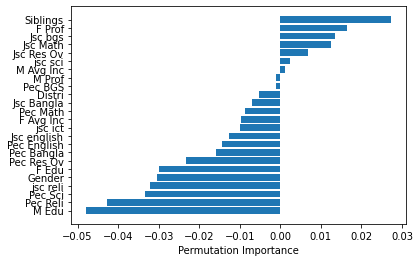

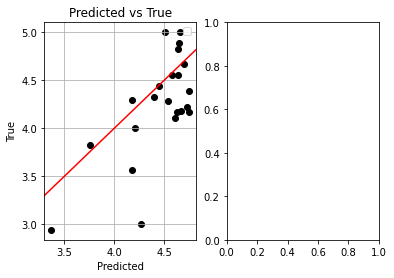

In [21]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors=10)
knn.fit(X_train, y_train)

y_pred_test_x_knn = knn.predict(X_test)
metrics("KNN",y_pred_test_x_knn)
feature_importance(knn)
predicted_plot(y_pred_test_x_knn)

In [22]:
df = pd.DataFrame(l, columns=["model_name", "explained_variance", "max_error", "mean", "rmse", "r2","mape", "mean_poisson_deviance", "mean_gamma_deviance", "mean_absolute_percentage_error", "d2_tweedie_score"])
df

,model_name,explained_variance,max_error,mean,rmse,r2,mape,mean_poisson_deviance,mean_gamma_deviance,mean_absolute_percentage_error,d2_tweedie_score
0,SVR,0.558916,1.203309,0.263575,0.365942,0.534092,6.904104,0.033906,0.008706,0.069041,0.534092
1,Random Forest,0.514893,1.375500,0.266623,0.384224,0.486378,6.895009,0.036536,0.009134,0.068950,0.486378
2,Linear Regression,0.357799,1.378018,0.316899,0.429913,0.356961,7.890604,0.044692,0.010942,0.078906,0.356961
3,ADA Boost Regressor,0.457631,1.333947,0.297330,0.409526,0.416501,7.692714,0.042029,0.010665,0.076927,0.416501
4,XGBoost,0.551153,1.256204,0.267946,0.370186,0.523223,6.874358,0.034099,0.008584,0.068744,0.523223
5,MLP,-1.891564,2.000411,0.729833,0.927654,-1.993974,18.102642,0.221776,0.059418,0.181026,-1.993974
6,GRADIENT,0.315774,1.297846,0.319247,0.450657,0.293410,8.388411,0.050926,0.012926,0.083884,0.293410
7,Optimized GRADIENT,0.541848,1.241112,0.262804,0.374686,0.511562,6.790807,0.034929,0.008811,0.067908,0.511562
8,KNN,0.477097,1.270000,0.333818,0.436604,0.336789,8.603644,0.046289,0.011396,0.086036,0.336789


In [23]:
# import shap library
import shap

# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(rf_regressor)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation 
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train[0])

In [24]:
import lime
import lime.lime_tabular
# LIME has one explainer for all the models
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names= feature_names,
                                                  class_names=['MEDV'], verbose=True, mode='regression')

In [25]:
j = 5
exp = explainer.explain_instance(X_test[j], rf_regressor.predict, num_features=6)

# Show the predictions
exp.show_in_notebook(show_table=True)

Intercept 4.662955243119818
Prediction_local [3.56757762]
Right: 3.107700000000001


In [26]:
j = 7
exp = explainer.explain_instance(X_test[j], rf_regressor.predict, num_features=6)

# Show the predictions
exp.show_in_notebook(show_table=True)

Intercept 4.3407598710406505
Prediction_local [4.3939407]
Right: 4.375499999999999


In [27]:
j = 16
exp = explainer.explain_instance(X_test[j], rf_regressor.predict, num_features=6)

# Show the predictions
exp.show_in_notebook(show_table=True)

Intercept 4.548719347337648
Prediction_local [3.70792252]
Right: 3.8796999999999993


In [30]:
test = y_test
test = test.to_numpy()

In [31]:
for i in range(10,15):
    exp = explainer.explain_instance(X_test[i], rf_regressor.predict, num_features=6)
    print("Y True: ", test[i])
    # Show the predictions
    exp.show_in_notebook(show_table=True)

Intercept 4.313988137811682
Prediction_local [4.55262168]
Right: 4.252300000000002
Y True:  4.11


Intercept 4.110719370668424
Prediction_local [4.6997259]
Right: 4.296099999999998
Y True:  4.17


Intercept 4.470542545700907
Prediction_local [4.04108701]
Right: 3.8981999999999983
Y True:  3.56


Intercept 4.223360104353377
Prediction_local [4.2757543]
Right: 4.332899999999999
Y True:  4.0


Intercept 4.268587510280527
Prediction_local [4.6123555]
Right: 4.685300000000002
Y True:  4.67
